<a href="https://colab.research.google.com/github/Deem-KSU/IT326-Group1-56546/blob/main/Reports/Phase3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Problem:

In this project, we are going to address the problem of student depression, which affects both well-being and academic performance. We want to solve the challenge of identifying which students are at risk of depression by applying data mining techniques.

Through this, we aim to uncover meaningful patterns that can support early detection and provide valuable insights for improving student mental health.

#2. Data Mining Task:

* **Classification Task** – Predict whether a student is depressed or not ( 0 = No Depression, 1 = Depression) based on different features such as academic, social, and lifestyle factors.

<br>

* **Clustering Task** – Group students into clusters with similar characteristics. This can help in finding hidden patterns and risk factors related to student depression.

#3. Data:

**Dataset Source:**

The dataset used in this project is the Student Depression Dataset, which was obtained from Kaggle.

 https://www.kaggle.com/datasets/adilshamim8/student-depression-dataset

**Dataset Description:**
- Attributes: 18 columns

In [ ]:
import pandas as pd
import kagglehub
from kagglehub import KaggleDatasetAdapter

path = 'student_depression_dataset.csv'
raw_dataset = kagglehub.dataset_load(KaggleDatasetAdapter.PANDAS,
  "adilshamim8/student-depression-dataset", path)

print('Number of attributes: ', raw_dataset.shape[1])

Using Colab cache for faster access to the 'student-depression-dataset' dataset.
Number of attributes:  18


- Data type of each attribute:

-Integer (id, Depression)

-Float (Age, Academic Pressure, Work Pressure, CGPA, Study Satisfaction, Job Satisfaction, Work/Study Hours)

-Object (Gender, City, Profession, Sleep Duration, Dietary Habits, Degree, Have you ever had suicidal thoughts ?, Financial Stress, Family History of Mental Illness)

In [ ]:
print ('Data types of attributes: \n',)
raw_dataset.info()

Data types of attributes: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27901 entries, 0 to 27900
Data columns (total 18 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     27901 non-null  int64  
 1   Gender                                 27901 non-null  object 
 2   Age                                    27901 non-null  float64
 3   City                                   27901 non-null  object 
 4   Profession                             27901 non-null  object 
 5   Academic Pressure                      27901 non-null  float64
 6   Work Pressure                          27901 non-null  float64
 7   CGPA                                   27901 non-null  float64
 8   Study Satisfaction                     27901 non-null  float64
 9   Job Satisfaction                       27901 non-null  float64
 10  Sleep Duration                         279

- Objects: 27901 rows

In [ ]:
print('Number of objects: ', raw_dataset.shape[0])

Number of objects:  27901


- Class attribute: "Depression" with 2 labels (0 = No Depression, 1 = Depression)

In [ ]:
# 0 = No Depression, 1 = Depression
Depression_count = raw_dataset['Depression'].value_counts()
print('Count of each label of the class attribute (Depression): \n \n', Depression_count)

Count of each label of the class attribute (Depression): 
 
 Depression
1    16336
0    11565
Name: count, dtype: int64


- Sample of 500 objects randomly selected:

In [ ]:
#Sample of 500 student
Depression_sample= raw_dataset.sample(n=500, random_state=1)
print(Depression_sample)

           id  Gender   Age       City Profession  Academic Pressure  \
9176    46312  Female  19.0    Lucknow    Student                5.0   
3456    17313    Male  34.0  Ahmedabad    Student                2.0   
12221   61739    Male  28.0     Kanpur    Student                3.0   
25762  129847  Female  18.0     Indore    Student                4.0   
23828  120034    Male  34.0  Ahmedabad    Student                2.0   
...       ...     ...   ...        ...        ...                ...   
8165    41132  Female  33.0       Pune    Student                2.0   
8439    42487  Female  19.0     Nashik    Student                1.0   
21466  108445  Female  34.0      Patna    Student                1.0   
12478   63109    Male  18.0     Nashik    Student                5.0   
3832    19164    Male  27.0      Delhi    Student                4.0   

       Work Pressure  CGPA  Study Satisfaction  Job Satisfaction  \
9176             0.0  6.16                 3.0               0.0   

###Data Analysis:

**Statistical Summary:**

In [ ]:
#Financial Stress column is defined as object so we need to convert it to numeric first
raw_dataset['Financial Stress'] = pd.to_numeric(raw_dataset['Financial Stress'], errors='coerce')
raw_dataset.dropna(subset=['Financial Stress'], inplace=True)

# Select only numeric columns that produce meaningful values (For example 'id' attribute doesn't have a meaning here)
numeric_cols = raw_dataset[['Age', 'Academic Pressure', 'Work Pressure', 'CGPA', 'Study Satisfaction', 'Job Satisfaction', 'Work/Study Hours', 'Financial Stress' ]]

numeric_cols.describe()


,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress
count,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000
mean,25.822174,3.141336,0.000430,7.656160,2.943974,0.000681,7.156570,3.139867
std,4.905651,1.381462,0.043994,1.470708,1.361122,0.044397,3.707598,1.437347
min,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,21.000000,2.000000,0.000000,6.290000,2.000000,0.000000,4.000000,2.000000
50%,25.000000,3.000000,0.000000,7.770000,3.000000,0.000000,8.000000,3.000000
75%,30.000000,4.000000,0.000000,8.920000,4.000000,0.000000,10.000000,4.000000
max,59.000000,5.000000,5.000000,10.000000,5.000000,4.000000,12.000000,5.000000


**Five-Number Summary (Minimum, Q1, Median, Q3, Maximum):**

In [ ]:
print ('1. Age attribute:\n\n''Minimum:', raw_dataset['Age'].min(), ' \nQ1:', raw_dataset['Age'].quantile(0.25), ' \nMedian:', raw_dataset['Age'].median(), ' \nQ3:', raw_dataset['Age'].quantile(0.75), ' \nMaximum:', raw_dataset['Age'].max())
print ('\n\n2. Academic Pressure attribute:\n\n''Minimum:', raw_dataset['Academic Pressure'].min(), ' \nQ1:', raw_dataset['Academic Pressure'].quantile(0.25), ' \nMedian:', raw_dataset['Academic Pressure'].median(), ' \nQ3:', raw_dataset['Academic Pressure'].quantile(0.75), ' \nMaximum:', raw_dataset['Academic Pressure'].max())
print ('\n\n3. Work Pressure attribute:\n\n''Minimum:', raw_dataset['Work Pressure'].min(), ' \nQ1:', raw_dataset['Work Pressure'].quantile(0.25), ' \nMedian:', raw_dataset['Work Pressure'].median(), ' \nQ3:', raw_dataset['Work Pressure'].quantile(0.75), ' \nMaximum:', raw_dataset['Work Pressure'].max())
print ('\n\n4.CGPA attribute:\n\n''Minimum:', raw_dataset['CGPA'].min(), ' \nQ1:', raw_dataset['CGPA'].quantile(0.25), ' \nMedian:', raw_dataset['CGPA'].median(), ' \nQ3:', raw_dataset['CGPA'].quantile(0.75), ' \nMaximum:', raw_dataset['CGPA'].max())
print ('\n\n5.Study Satisfaction attribute:\n\n''Minimum:', raw_dataset['Study Satisfaction'].min(), ' \nQ1:', raw_dataset['Study Satisfaction'].quantile(0.25), ' \nMedian:', raw_dataset['Study Satisfaction'].median(), ' \nQ3:', raw_dataset['Study Satisfaction'].quantile(0.75), ' \nMaximum:', raw_dataset['Study Satisfaction'].max())
print ('\n\n6.Job Satisfaction attribute:\n\n''Minimum:', raw_dataset['Job Satisfaction'].min(), ' \nQ1:', raw_dataset['Job Satisfaction'].quantile(0.25), ' \nMedian:', raw_dataset['Job Satisfaction'].median(), ' \nQ3:', raw_dataset['Job Satisfaction'].quantile(0.75), ' \nMaximum:', raw_dataset['Job Satisfaction'].max())
print ('\n\n7.Work/Study Hours attribute:\n\n''Minimum:', raw_dataset['Work/Study Hours'].min(), ' \nQ1:', raw_dataset['Work/Study Hours'].quantile(0.25), ' \nMedian:', raw_dataset['Work/Study Hours'].median(), ' \nQ3:', raw_dataset['Work/Study Hours'].quantile(0.75), ' \nMaximum:', raw_dataset['Work/Study Hours'].max())
print ('\n\n8.Financial Stress attribute:\n\n''Minimum:', raw_dataset['Financial Stress'].min(), ' \nQ1:', raw_dataset['Financial Stress'].quantile(0.25), ' \nMedian:', raw_dataset['Financial Stress'].median(), ' \nQ3:', raw_dataset['Financial Stress'].quantile(0.75), ' \nMaximum:', raw_dataset['Financial Stress'].max())

1. Age attribute:

Minimum: 18.0  
Q1: 21.0  
Median: 25.0  
Q3: 30.0  
Maximum: 59.0


2. Academic Pressure attribute:

Minimum: 0.0  
Q1: 2.0  
Median: 3.0  
Q3: 4.0  
Maximum: 5.0


3. Work Pressure attribute:

Minimum: 0.0  
Q1: 0.0  
Median: 0.0  
Q3: 0.0  
Maximum: 5.0


4.CGPA attribute:

Minimum: 0.0  
Q1: 6.29  
Median: 7.77  
Q3: 8.92  
Maximum: 10.0


5.Study Satisfaction attribute:

Minimum: 0.0  
Q1: 2.0  
Median: 3.0  
Q3: 4.0  
Maximum: 5.0


6.Job Satisfaction attribute:

Minimum: 0.0  
Q1: 0.0  
Median: 0.0  
Q3: 0.0  
Maximum: 4.0


7.Work/Study Hours attribute:

Minimum: 0.0  
Q1: 4.0  
Median: 8.0  
Q3: 10.0  
Maximum: 12.0


8.Financial Stress attribute:

Minimum: 1.0  
Q1: 2.0  
Median: 3.0  
Q3: 4.0  
Maximum: 5.0


**Outliers:**

In [ ]:
import numpy as np

outliers = {}
for col in numeric_cols.columns:
    mean = np.mean(numeric_cols[col])
    std = np.std(numeric_cols[col])
    col_outliers = numeric_cols[col][abs(numeric_cols[col]-mean) > 3 * std]
    outliers[col] = col_outliers.tolist()

print("Outliers number in each numeric column:")
for col, outlier_list in outliers.items():
    print(f"{col}: {len(outlier_list)} outliers")

Outliers number in each numeric column:
Age: 19 outliers
Academic Pressure: 0 outliers
Work Pressure: 3 outliers
CGPA: 9 outliers
Study Satisfaction: 0 outliers
Job Satisfaction: 8 outliers
Work/Study Hours: 0 outliers
Financial Stress: 0 outliers


Only Age, Work Pressure, CGPA, and Job Satisfaction attributess have outliers.


In [ ]:
from scipy.stats import zscore

z_scores = numeric_cols.apply(zscore)

outliers = {}
for col in z_scores.columns:
    col_outliers = numeric_cols[z_scores[col].abs() > 3][col]
    outliers[col] = col_outliers.tolist()

print('Outliers values in each numeric column:\n', outliers)

Outliers values in each numeric column:
 {'Age': [42.0, 58.0, 49.0, 51.0, 44.0, 43.0, 46.0, 59.0, 42.0, 54.0, 48.0, 56.0, 43.0, 46.0, 42.0, 42.0, 48.0, 41.0, 48.0], 'Academic Pressure': [], 'Work Pressure': [5.0, 2.0, 5.0], 'CGPA': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'Study Satisfaction': [], 'Job Satisfaction': [3.0, 4.0, 2.0, 1.0, 1.0, 2.0, 4.0, 2.0], 'Work/Study Hours': [], 'Financial Stress': []}


**Boxplots:**

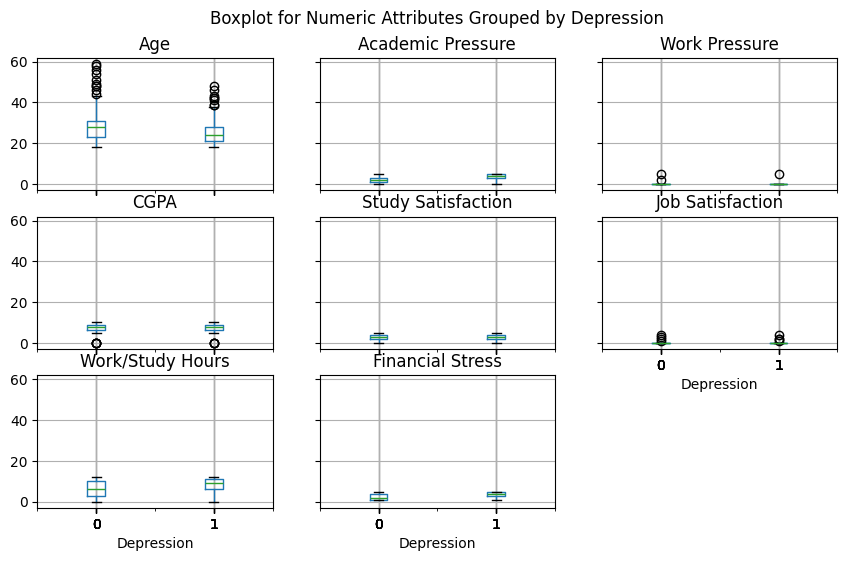

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

raw_dataset.boxplot(column=['Age', 'Academic Pressure', 'Work Pressure', 'CGPA', 'Study Satisfaction', 'Job Satisfaction', 'Work/Study Hours', 'Financial Stress' ], by='Depression', figsize=(10,6))
plt.suptitle('Boxplot for Numeric Attributes Grouped by Depression')
plt.show()

**Missing Values:**

In [ ]:
print ('Missing values in each column: \n',raw_dataset.isna().sum())

Missing values in each column: 
 id                                       0
Gender                                   0
Age                                      0
City                                     0
Profession                               0
Academic Pressure                        0
Work Pressure                            0
CGPA                                     0
Study Satisfaction                       0
Job Satisfaction                         0
Sleep Duration                           0
Dietary Habits                           0
Degree                                   0
Have you ever had suicidal thoughts ?    0
Work/Study Hours                         0
Financial Stress                         0
Family History of Mental Illness         0
Depression                               0
dtype: int64


No missing values in the dataset.

**Aggregated Data:**

In [ ]:
print ('Agregated data by Depression attribute:\n', raw_dataset.groupby('Depression')[numeric_cols.columns].mean())

Agregated data by Depression attribute:
                   Age  Academic Pressure  Work Pressure      CGPA  \
Depression                                                          
0           27.142869           2.361757       0.000605  7.617236   
1           24.887297           3.693174       0.000306  7.683713   

            Study Satisfaction  Job Satisfaction  Work/Study Hours  \
Depression                                                           
0                     3.215774          0.000865          6.237222   
1                     2.751576          0.000551          7.807346   

            Financial Stress  
Depression                    
0                   2.518724  
1                   3.579553  


Aggregation is summarizing or condensing information based on a column to derive insights from data.

0 = No Depression, 1 = Depression

It shows that Depression (1) is associated with younger age, less work pressure and study and job satisfaction, and more academic pressure, CGPA, work/study hours, and financial stress. While No Depression (0) is the opposite.

###Visualisation:

**Scatter Plot:**

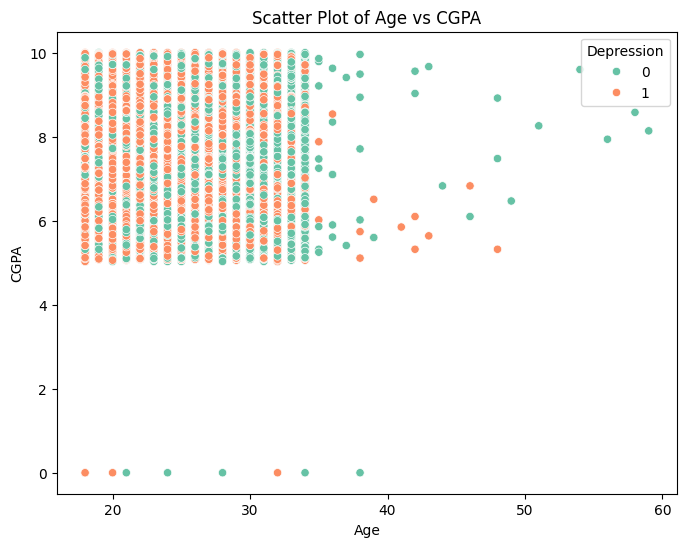

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot( x='Age', y='CGPA', data=raw_dataset, hue='Depression', palette='Set2')
plt.title('Scatter Plot of Age vs CGPA')
plt.xlabel('Age')
plt.ylabel('CGPA')
plt.show()

This scatter plot compares students’ Age and CGPA (overall grade). Each dot represents one student, and the colors indicate the Depression class (0 = not depressed, 1 = depressed). The plot helps us check if there is a pattern between age and academic performance, and whether depressed and non-depressed students show differences. This is useful for understanding the data and preparing it for preprocessing.

**Histogram:**

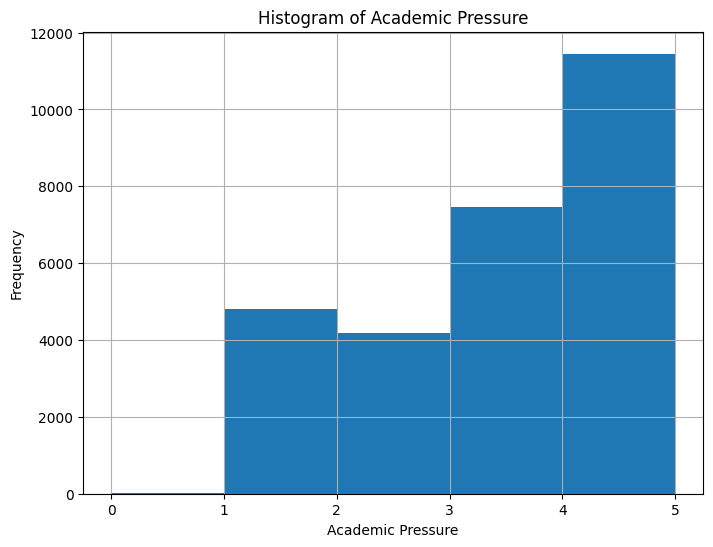

In [ ]:
raw_dataset['Academic Pressure'].hist(bins=5, figsize=(8,6))
plt.title('Histogram of Academic Pressure')
plt.xlabel('Academic Pressure')
plt.ylabel('Frequency')
plt.show()

This histogram shows how students are distributed across different levels of academic pressure (0–5). The plot reveals that most students report moderate to high academic pressure, while fewer students report very low or no pressure. This is important because high academic pressure is often linked to higher chances of depression. The imbalance in the distribution suggests that preprocessing may be needed.

**Bar Plot:**

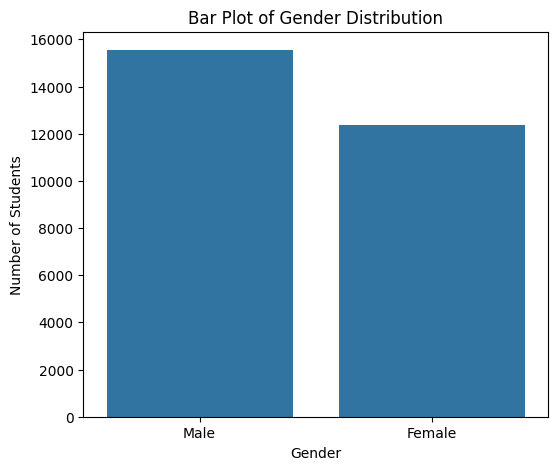

In [ ]:
plt.figure(figsize=(6,5))
sns.countplot(x='Gender', data=raw_dataset)
plt.title('Bar Plot of Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Number of Students')
plt.show()

This bar plot shows the distribution of students by gender. From the plot, we can observe if the dataset is balanced or skewed toward one gender. If one gender dominates(male), this imbalance may affect how models learn patterns related to depression. Understanding this distribution helps identify possible biases and decide if any adjustments to the data may be required later.

**Variables Distribution:**

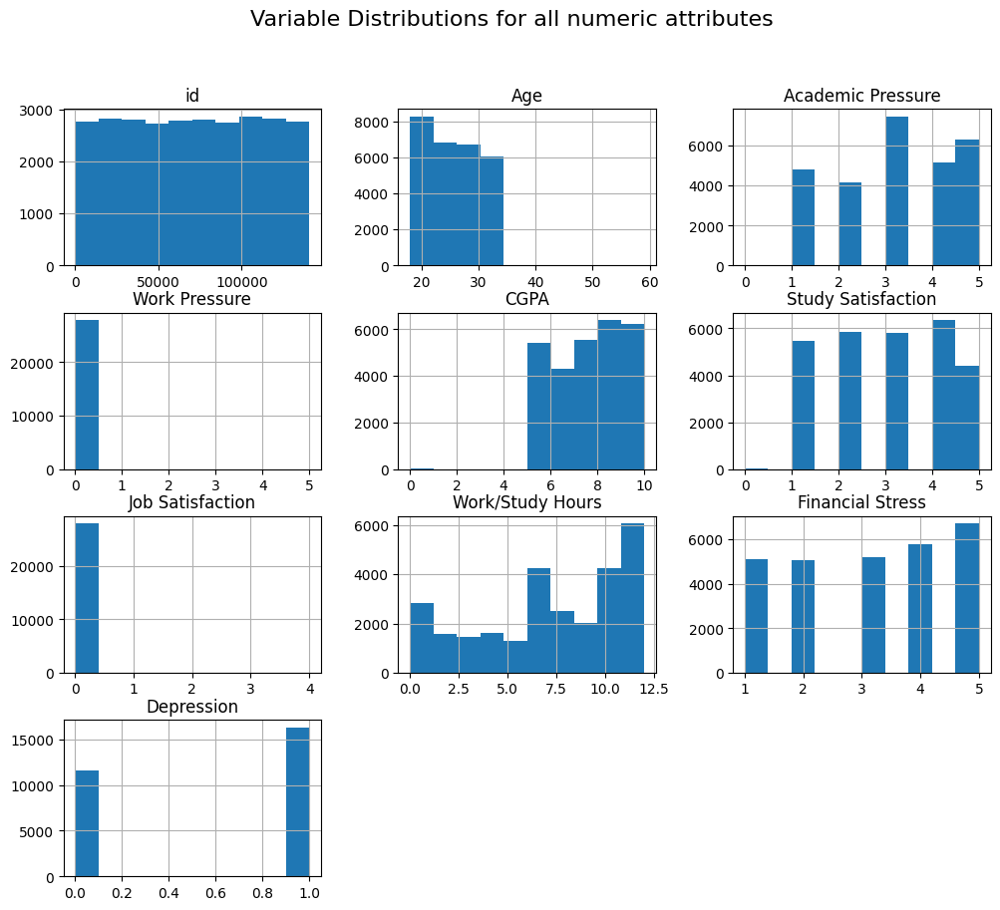

In [ ]:
raw_dataset.hist(figsize=(12,10))
plt.suptitle("Variable Distributions for all numeric attributes", fontsize=16)
plt.show()

This figure shows the distributions of all numeric attributes in the dataset. It helps visualize how each variable’s values are spread and identify any skewness or unusual patterns that may need attention during preprocessing. It reveals that some attributes are unevenly distributed, indicating possible imbalances or differences in data ranges — for example, Job Satisfaction and Work Pressure.

**Class Label Distribution:**

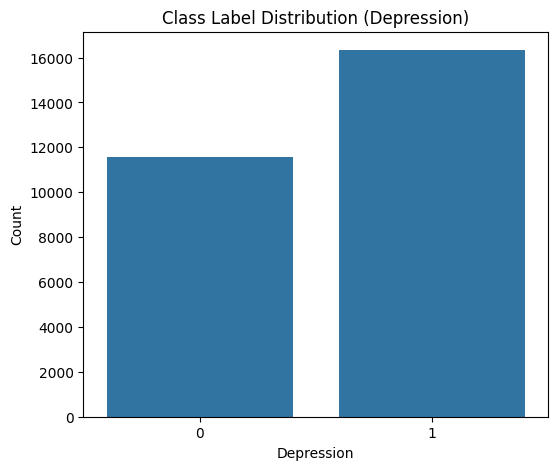

In [ ]:
plt.figure(figsize=(6,5))
sns.countplot(x='Depression', data=raw_dataset)
plt.title('Class Label Distribution (Depression)')
plt.xlabel('Depression')
plt.ylabel('Count')
plt.show()

This bar plot shows how many students are depressed (1) and not depressed (0). It helps check if the data is balanced or if one group is larger, which can affect model learning and may need attention before training. it reveals that the data set is not perfectly balanced as one group is larger than the other.

#4. Data preprocessing:

**Data Filtering and Removing Irrelevant Attributes:**

In this step, we filtered the dataset to include only students, as the study focuses on analyzing depression among students. Records where the Profession attribute was not "Student" were removed. After filtering, the Profession column contained only a single unique value ("Student"), so it was also removed.

Additionally, the attributes id, City, Work Pressure, and Job Satisfaction were removed. The id column is only an identifier and does not contribute to the analysis. The City column contains too many unique values that do not provide meaningful insight into students’ mental health. Both Work Pressure and Job Satisfaction columns were mostly equal to zero, indicating that most students were not employed. Removing these attributes helped simplify the dataset and reduce noise, ensuring that the remaining features are relevant for subsequent data mining tasks.

The Degree attribute was removed during preprocessing because it contained a large number of unique categorical values (more than 25 different degree types). Most of these values represent similar academic levels (e.g., Bachelor or Master programs) with minimal distinction between them. Such high-cardinality categorical data can introduce unnecessary complexity and noise into the dataset, making it harder for machine learning algorithms to identify meaningful patterns. Removing this attribute simplified the dataset and improved its overall quality and consistency for subsequent analysis.

In [ ]:
# Keep only student rows
preprocessed_dataset = raw_dataset[raw_dataset["Profession"].str.lower() == "student"].copy()

# Remove irrelevant or uninformative attributes
preprocessed_dataset = preprocessed_dataset.drop(columns=["id", "City", "Profession", "Work Pressure", "Job Satisfaction" , "Degree"])

print("Rows before:", raw_dataset.shape[0])
print("Number of rows after filtering:", preprocessed_dataset.shape[0])
print("Remaining columns:", preprocessed_dataset.columns.tolist())

Rows before: 27898
Number of rows after filtering: 27867
Remaining columns: ['Gender', 'Age', 'Academic Pressure', 'CGPA', 'Study Satisfaction', 'Sleep Duration', 'Dietary Habits', 'Have you ever had suicidal thoughts ?', 'Work/Study Hours', 'Financial Stress', 'Family History of Mental Illness', 'Depression']


**Outlier Handling:**

We applied outlier detection using the Z-score method on numerical attributes such as Age, Academic Pressure, CGPA, Study Satisfaction,Financial Stress, and Work/Study Hours. Records with Z-scores greater than ±3 were removed. This step helped reduce noise in the dataset by eliminating unrealistic values. Removing outliers ensures that the classification and clustering algorithms are not biased by extreme values, resulting in more accurate and reliable model performance. Additionally, this preprocessing step improved the overall data consistency, which supports better learning patterns during the data mining phase.

In [ ]:
numeric_cols = ["Age", "Academic Pressure", "CGPA",
                "Study Satisfaction", "Financial Stress" ,"Work/Study Hours"]

z_scores = preprocessed_dataset[numeric_cols].apply(zscore)
threshold = 3
mask = (np.abs(z_scores) < threshold).all(axis=1)
preprocessed_dataset = preprocessed_dataset[mask].copy()

print("Rows after :", preprocessed_dataset.shape[0])

Rows after : 27839


**Encoding Categorical Variables:**

Several attributes in the dataset were categorical, such as Gender, Sleep Duration, Dietary Habits, Family History of Mental Illness, and Suicidal Thoughts. Since machine learning models cannot directly process textual data, we applied Label Encoding to convert categorical values into numeric form. For example, Gender was encoded as Male = 0 and Female = 1. This transformation allowed the dataset to be compatible with classification and clustering algorithms. Moreover, encoding categorical variables ensured that all features could be mathematically compared and processed by the models, leading to improved consistency and interpretability in the data.

In [ ]:
from sklearn.preprocessing import LabelEncoder

categorical_cols = [
    "Gender",
    "Sleep Duration",
    "Dietary Habits",
    "Family History of Mental Illness",
    "Have you ever had suicidal thoughts ?"
]

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    preprocessed_dataset[col] = le.fit_transform(preprocessed_dataset[col].astype(str))
    label_encoders[col] = le

**Normalization :**

We applied Min-Max Normalization on numerical attributes such as Age, Academic Pressure, Work Pressure, CGPA, Study Satisfaction, Job Satisfaction, Work/Study Hours, and Financial Stress.This transformation scaled all numerical features to a range between 0 and 1. Normalization ensures that all attributes contribute equally during the classification and clustering stages, preventing attributes with larger numeric ranges from dominating the results. This step improves the performance and accuracy of machine learning algorithms like Decision Tree.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

columns_to_normalize=['Age','Academic Pressure','CGPA','Study Satisfaction','Work/Study Hours','Financial Stress']


minmax_scaler=MinMaxScaler()
preprocessed_dataset[columns_to_normalize] = minmax_scaler.fit_transform(preprocessed_dataset[columns_to_normalize])


preprocessed_dataset.to_csv("preprocessed_dataset.csv", index=False)
print("Final dataset saved as preprocessed_dataset.csv")

Final dataset saved as preprocessed_dataset.csv


**Snapshot of the datasets:**

In [ ]:
print("Raw Dataset Sample:")
display(raw_dataset.head())

print("\nPreprocessed Dataset Sample:")
display(preprocessed_dataset.head())

Raw Dataset Sample:


,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,'5-6 hours',Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,'5-6 hours',Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,'Less than 5 hours',Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,'7-8 hours',Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,'5-6 hours',Moderate,M.Tech,Yes,1.0,1.0,No,0



Preprocessed Dataset Sample:


,Gender,Age,Academic Pressure,CGPA,Study Satisfaction,Sleep Duration,Dietary Habits,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,1,0.714286,1.0,0.792757,0.4,0,0,1,0.250000,0.00,0,1
1,0,0.285714,0.4,0.175050,1.0,0,1,0,0.250000,0.25,1,0
2,1,0.619048,0.6,0.402414,1.0,2,0,0,0.750000,0.00,1,0
3,0,0.476190,0.6,0.112676,0.4,1,1,1,0.333333,1.00,1,1
4,0,0.333333,0.8,0.623742,0.6,0,1,1,0.083333,0.00,0,0


#5. Data Mining Technique:

###Classification:

**Python Packages:**

	•	pandas
	•	sklearn.tree → DecisionTreeClassifier
	•	sklearn → matrix
	•	sklearn.model_selection → train_test_split
	•	sklearn.metrics → accuracy_score, confusion_matrix, ConfusionMatrixDisplay

**Methods:**

	•	fit()
	•	DecisionTreeClassifier()
	•	DecisionTreeClassifier(criterion=“entropy”)
	•	DecisionTreeClassifier(criterion=“entropy”, max_depth=3)
	•	train_test_split()
	•	accuracy_score()
	•	confusion_matrix()
	•	ConfusionMatrixDisplay.from_estimator()

we used the Decision Tree algorithm to predict whether a student is depressed (1) or not (0), based on the features available after preprocessing.

To evaluate the model thoroughly, we tested three different train–test splits:

	•	90% training – 10% testing
	•	80% training – 20% testing
	•	70% training – 30% testing

For each split, two Decision Tree models were trained using different splitting criteria:

	1.	Gini Index
	2.	Information Gain (Entropy)

After training the models, performance was evaluated using:

	•	Accuracy
	•	Confusion Matrix to assess how well each class was predicted.

###Clustering:

**Python Packages:**

	•	pandas
	•	seaborn
	•	matplotlib.pyplot
	•	sklearn.cluster → KMeans
	•	sklearn.metrics → silhouette_score
	•	sklearn.decomposition → PCA


**Methods:**

	•	KMeans()
	•	fit()
	•	fit_predict()
	•	silhouette_score()
	•	PCA.fit_transform()
	•	scatterplot()
	•	plot()

we applied the K-Means algorithm to group students based on similarities in their characteristics. To determine an appropriate number of clusters, we first used the Elbow Method by calculating the WCSS values for different K values (from 2 to 9) and identifying where the curve begins to level off.

We then evaluated the clustering quality using the Silhouette Score for three selected cluster sizes:

	•	K = 2
	•	K = 3
	•	K = 4

K-Means was then applied for each of these values to generate cluster labels for all students.

To visualize the clusters, we used PCA (Principal Component Analysis) to reduce the data to two dimensions and plotted the clusters to observe how well they are separated.

This process allowed us to compare different K values and identify which clustering configuration produced the most meaningful and well-separated groups.


#6. Evaluation and Comparison:


##Classification:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import tree

url = "https://raw.githubusercontent.com/Deem-KSU/IT326-Group1-56546/main/Dataset/Preprocessed_dataset.csv"
preprocessed_data= pd.read_csv(url)
preprocessed_data.head()

,Gender,Age,Academic Pressure,CGPA,Study Satisfaction,Sleep Duration,Dietary Habits,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,1,0.714286,1.0,0.792757,0.4,0,0,1,0.250000,0.00,0,1
1,0,0.285714,0.4,0.175050,1.0,0,1,0,0.250000,0.25,1,0
2,1,0.619048,0.6,0.402414,1.0,2,0,0,0.750000,0.00,1,0
3,0,0.476190,0.6,0.112676,0.4,1,1,1,0.333333,1.00,1,1
4,0,0.333333,0.8,0.623742,0.6,0,1,1,0.083333,0.00,0,0


###Feature Selection:

In [ ]:
#spliting data into features and target
col= preprocessed_data.keys().tolist() [:-1]
features= preprocessed_data[col]
target= preprocessed_data['Depression']
print ("Features columns: \n\n",features)
print ("class column: \n \n",target)

Features columns: 

        Gender       Age  Academic Pressure      CGPA  Study Satisfaction  \
0           1  0.714286                1.0  0.792757                 0.4   
1           0  0.285714                0.4  0.175050                 1.0   
2           1  0.619048                0.6  0.402414                 1.0   
3           0  0.476190                0.6  0.112676                 0.4   
4           0  0.333333                0.8  0.623742                 0.6   
...       ...       ...                ...       ...                 ...   
27834       0  0.428571                1.0  0.144869                 1.0   
27835       1  0.428571                0.4  0.879276                 0.6   
27836       1  0.619048                0.6  0.317907                 0.8   
27837       0  0.000000                1.0  0.372233                 0.4   
27838       1  0.428571                0.8  0.847082                 0.2   

       Sleep Duration  Dietary Habits  Have you ever had suicidal 

###Data Splitting:
####1- 90 % training set and 10% testing set:

In [ ]:
f_train1, f_test1, t_train1, t_test1 = train_test_split(features, target, test_size=0.1, random_state=1)

*   Using Gini index:

Accuracy: 0.766882183908046

Confusion Matrix:



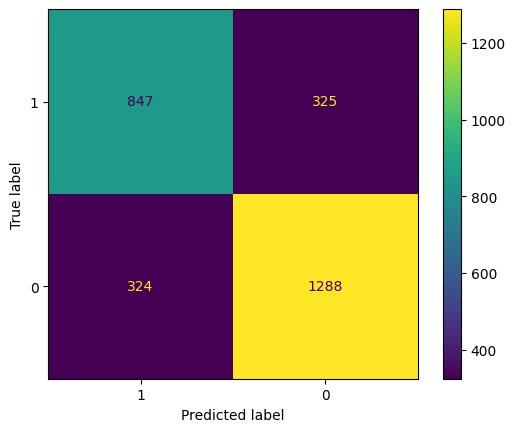

In [ ]:
clf1G= DecisionTreeClassifier()
clf1G= clf1G.fit(f_train1, t_train1)
t_pred1G= clf1G.predict(f_test1)
print ("Accuracy:", metrics.accuracy_score(t_test1, t_pred1G))

print ("\nConfusion Matrix:\n")
cn= preprocessed_data['Depression'].unique()
disp1G= ConfusionMatrixDisplay.from_estimator(clf1G, f_test1, t_test1, display_labels=cn)

*   Using IG (entropy):

Accuracy: 0.7805316091954023

Confusion Matrix:



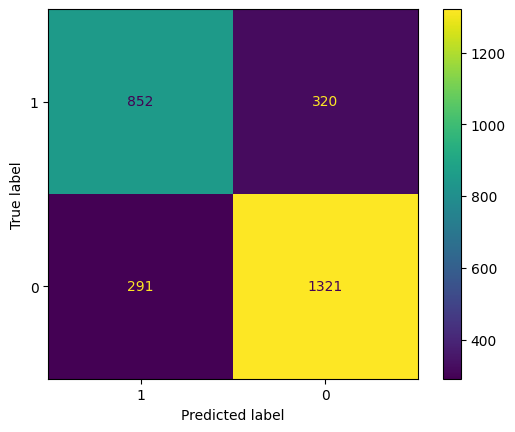

In [ ]:
clf1E= DecisionTreeClassifier(criterion="entropy")
clf1E= clf1E.fit(f_train1, t_train1)
t_pred1E= clf1E.predict(f_test1)
print ("Accuracy:", metrics.accuracy_score(t_test1, t_pred1E))

print ("\nConfusion Matrix:\n")
disp1E= ConfusionMatrixDisplay.from_estimator(clf1E, f_test1, t_test1, display_labels=cn)

**Which Algorithm Performs Best:**

 • 90/10 split: Entropy performs best (0.7805316091954023 > 0.766882183908046)

####2- 80 % training set and 20% testing set:

In [ ]:
f_train2, f_test2, t_train2, t_test2 = train_test_split(features, target, test_size=0.2, random_state=2)

*   Using Gini index:

Accuracy: 0.7614942528735632

Confusion Matrix:



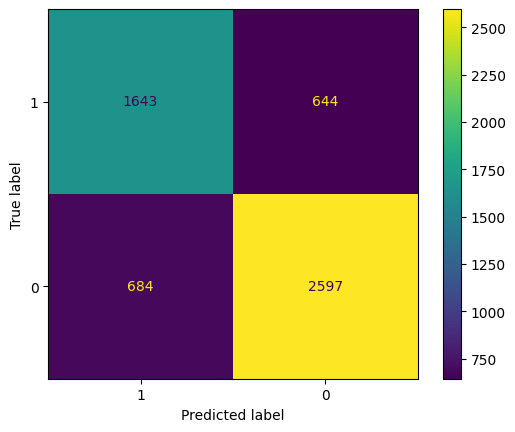

In [ ]:
clf2G= DecisionTreeClassifier()
clf2G= clf2G.fit(f_train2, t_train2)
t_pred2G= clf2G.predict(f_test2)
print ("Accuracy:", metrics.accuracy_score(t_test2, t_pred2G))

print ("\nConfusion Matrix:\n")
disp2G= ConfusionMatrixDisplay.from_estimator(clf2G, f_test2, t_test2, display_labels=cn)

*   Using IG (entropy):

Accuracy: 0.7634698275862069

Confusion Matrix:



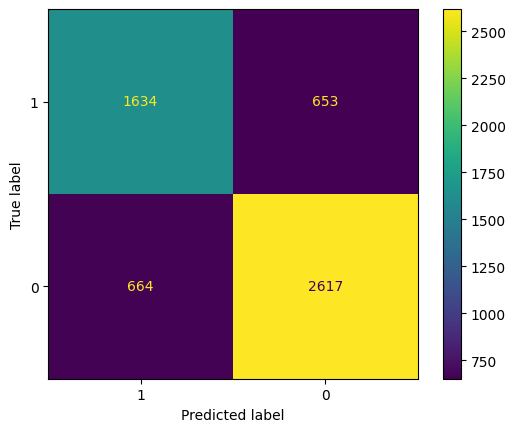

In [ ]:
clf2E= DecisionTreeClassifier(criterion="entropy")
clf2E= clf2E.fit(f_train2, t_train2)
t_pred2E= clf2E.predict(f_test2)
print ("Accuracy:", metrics.accuracy_score(t_test2, t_pred2E))

print ("\nConfusion Matrix:\n")
disp2E= ConfusionMatrixDisplay.from_estimator(clf2E, f_test2, t_test2, display_labels=cn)

**Which Algorithm Performs Best:**

 • 80/20 split: Entropy performs best (0.7634698275862069 > 0.7614942528735632)

####3- 70 % training set and 30% testing set:

In [ ]:
f_train3, f_test3, t_train3, t_test3 = train_test_split(features, target, test_size=0.30, random_state=1)

* Using Gini index

Accuracy: 0.76352969348659

Confusion Matrix:



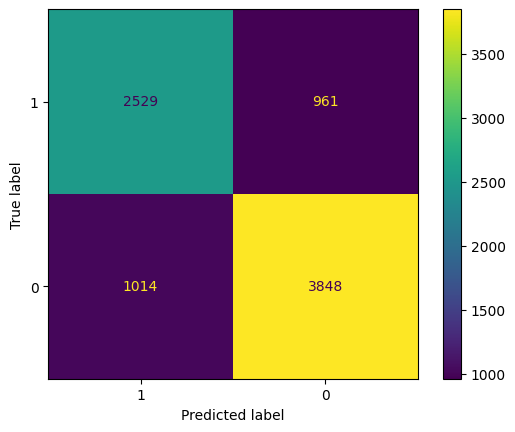

In [ ]:
clf3G = DecisionTreeClassifier()
clf3G = clf3G.fit(f_train3, t_train3)
t_pred3G = clf3G.predict(f_test3)

print("Accuracy:", metrics.accuracy_score(t_test3, t_pred3G))

print("\nConfusion Matrix:\n")

disp3G = ConfusionMatrixDisplay.from_estimator(clf3G, f_test3, t_test3, display_labels=cn)



*   Using IG (entropy):

Accuracy: 0.766882183908046

Confusion Matrix:



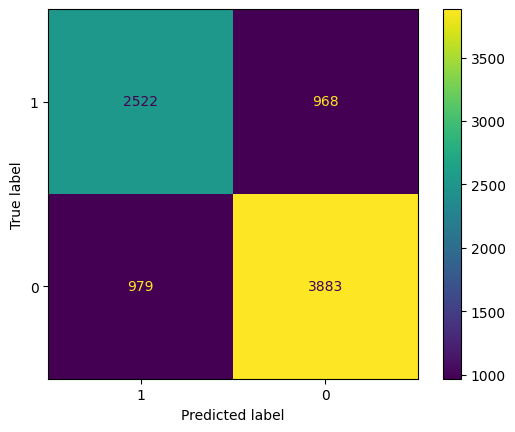

In [ ]:
clf3E = DecisionTreeClassifier(criterion="entropy")
clf3E = clf3E.fit(f_train3, t_train3)
t_pred3E = clf3E.predict(f_test3)

print("Accuracy:", metrics.accuracy_score(t_test3, t_pred3E))

print("\nConfusion Matrix:\n")
disp3E = ConfusionMatrixDisplay.from_estimator(clf3E, f_test3, t_test3, display_labels=cn)

**Which Algorithm Performs Best:**

 • 70/30 split: Entropy performs best (0.766882183908046 > 0.76352969348659)

### Gini Index – Accuracy Table

| Partition | Accuracy |
|----------|-----------|
| **90% training – 10% testing** | 0.766882183908046 |
| **80% training – 20% testing** | 0.7614942528735632 |
| **70% training – 30% testing** | 0.76352969348659 |

### Information Gain (Entropy) – Accuracy Table

| Partition | Accuracy |
|----------|-----------|
| **90% training – 10% testing** | 0.7805316091954023 |
| **80% training – 20% testing** | 0.7634698275862069 |
| **70% training – 30% testing** | 0.766882183908046 |


* **Which Algorithm Performs Best for Each Partition:**

 • 90/10 split: Entropy performs best (0.7805316091954023 > 0.766882183908046).

 • 80/20 split: Entropy performs best (0.7634698275862069 > 0.7614942528735632).

 • 70/30 split: Entropy performs best (0.766882183908046 > 0.76352969348659).

* **Comparison of Classification Results (Based on Accuracy):**

Across all three partitioning strategies (90/10, 80/20, and 70/30), the Entropy-based decision tree consistently achieved higher accuracy than the Gini-based model. Although the differences in accuracy were relatively small for each split, the pattern remained stable: Entropy produced slightly more effective splits, resulting in better generalization on the testing sets.

And as the training size increased, the accuracy for both models improved, but Entropy continued to maintain the lead, indicating that it captures more informative attribute relationships in this dataset. Overall, the comparison shows that Entropy provides a more accurate classification performance across all training–testing ratios.

* **Which Algorithm Performs Best Overall:**

Overall, Entropy (Information Gain) is the best-performing algorithm, as it achieves the highest accuracy in all three partitioning configurations and consistently outperforms the Gini index.

Moreover, the Entropy model with the 90/10 split is the best-performing partition among all, highlighting the positive effect of increasing the training set size on accuracy: the larger the training set, the more accurate and reliable the model becomes.

###Decision Tree (IG 90/10 split):
Since the 90% training and 10% test split using the Entropy criterion produced the best performance (Accuracy), we chose this partition to visualize the classification results using a decision tree.

In [ ]:
# 0 = No Depression, 1 = Depression
fig, axes= plt.subplots (nrows=1, ncols=1, figsize=(40,40), dpi=300)
tree.plot_tree(clf1E, feature_names= col, class_names= [str(x) for x in cn], filled=True)
plt.show()

###Pruning (IG 90/10 split):
Since the generated decision tree was extremely large and complex, it became difficult to interpret or extract meaningful insights from it. As the tree grows deeper and contains more nodes, the visual complexity increases and its interpretability decreases. Because the goal is not only to build an accurate model but also to understand the factors driving the predictions, we decided to apply pruning to simplify the tree.

Pruning helps reduce unnecessary branches by limiting the maximum depth or removing splits that add little predictive value. This results in a smaller, cleaner, and more interpretable model, while also reducing the risk of overfitting.

Therefore, we will apply pruning by setting an appropriate max_depth value (3) to obtain a simpler and more readable tree without significantly affecting model performance.

Accuracy: 0.8211206896551724

Confusion Matrix:



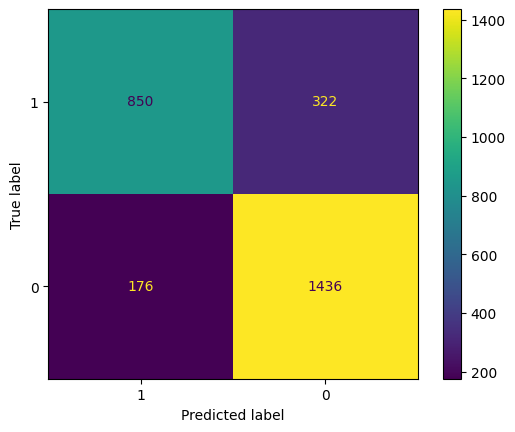

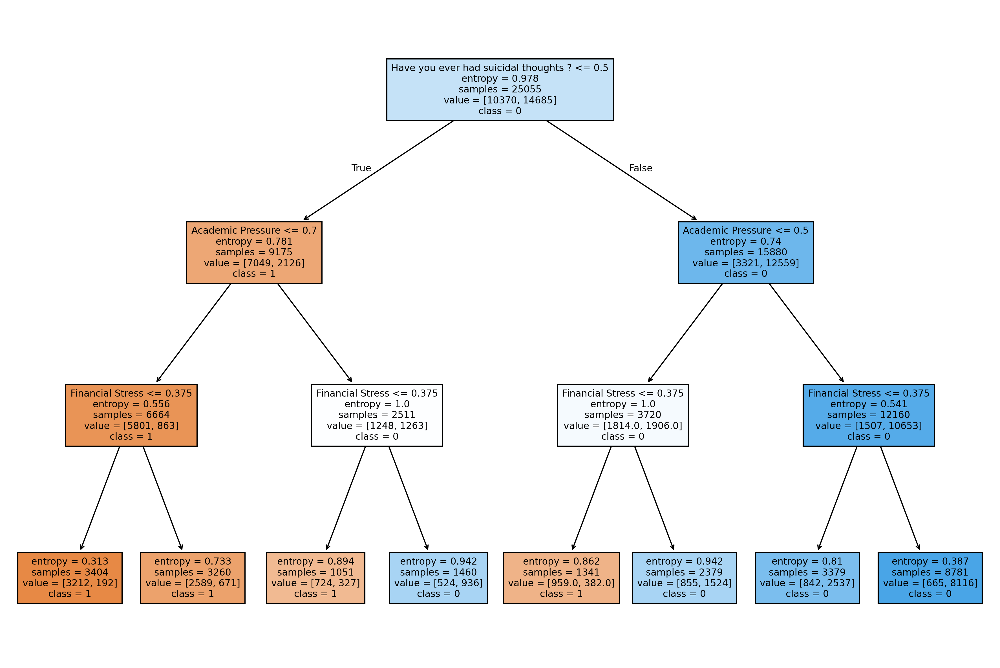

In [ ]:
# 0 = No Depression, 1 = Depression
clf_pruned = DecisionTreeClassifier(criterion="entropy", max_depth=3)
clf_pruned.fit(f_train1, t_train1)
t_pruned_pred = clf_pruned.predict(f_test1)

print("Accuracy:", metrics.accuracy_score(t_test1, t_pruned_pred))

print("\nConfusion Matrix:\n")

disp_pruned = ConfusionMatrixDisplay.from_estimator(clf_pruned, f_test1, t_test1, display_labels=cn)

fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
tree.plot_tree(clf_pruned,
               feature_names=col,
               class_names=[str(x) for x in cn],
               filled=True,
               fontsize=8)
plt.show()

##Clustering:

We selected K = 2, 3, and 4 because these values allow us to explore different levels of granularity in the clustering structure.

K = 2 identifies broad separation between low-risk and high-risk students.

K = 3 provides a moderate segmentation.

K = 4 reveals more detailed behavioral patterns.

###Elbow Method

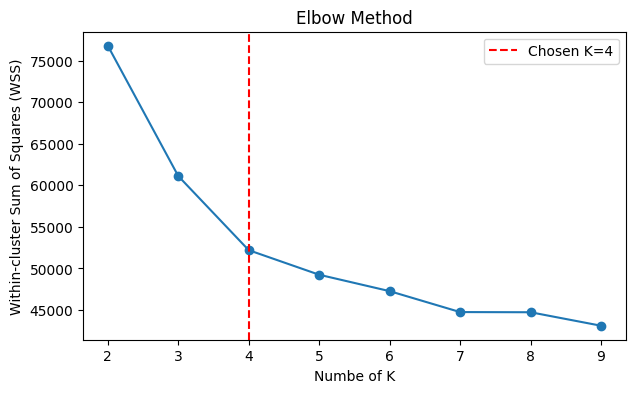

In [ ]:
from sklearn.cluster import KMeans

wcss_values = []
K_values = range(2, 10)

for k in K_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(preprocessed_data)
    wcss_values.append(kmeans.inertia_)

plt.figure(figsize=(7,4))
plt.plot(K_values, wcss_values, marker='o')
plt.title("Elbow Method")
plt.xlabel("Numbe of K")
plt.ylabel("Within-cluster Sum of Squares (WSS)")
plt.axvline(x=4, color='red', linestyle='--', label='Chosen K=4')
plt.legend()
plt.show()

We used the Elbow Method to identify the point where the WCSS starts decreasing more slowly.
Based on the curve, the slope begins to flatten around K = 4, indicating diminishing returns after this point.

###Silhouette Score

In [ ]:
from sklearn.metrics import silhouette_score

for k in [2, 3, 4]:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(preprocessed_data)
    score = silhouette_score(preprocessed_data, labels)
    print(f"Silhouette Score for K={k}: {score}")

Silhouette Score for K=2: 0.315400429549377
Silhouette Score for K=3: 0.27386531894137556
Silhouette Score for K=4: 0.2569640365998984


Higher Silhouette Coefficient values indicate better-defined clusters.
The highest score was achieved at K = 2, meaning this K produced the best separation between clusters.

###Apply K-means for K=2,3,4

In [ ]:
results = {}

for k in [2, 3, 4]:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(preprocessed_data)
    results[k] = labels
    preprocessed_data[f"K{k}_Cluster"] = labels


###Visualize clusters

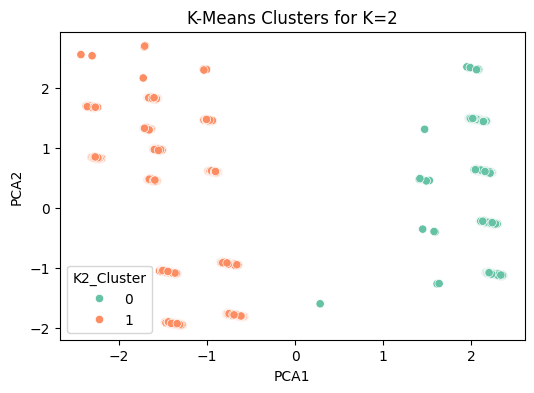

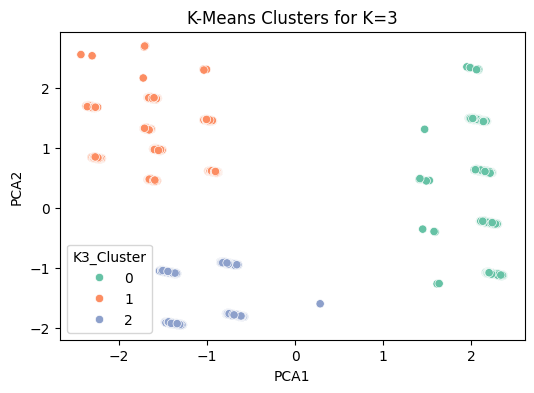

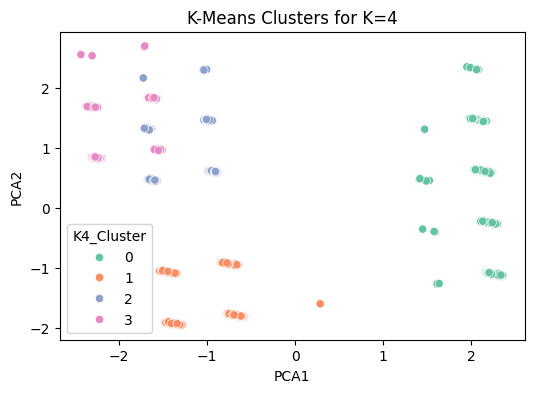

In [ ]:
from sklearn.decomposition import PCA
import seaborn as sns

pca = PCA(n_components=2)
pca_data = pca.fit_transform(preprocessed_data)

preprocessed_data['PCA1'] = pca_data[:,0]
preprocessed_data['PCA2'] = pca_data[:,1]

for k in [2, 3, 4]:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(
        data=preprocessed_data,
        x="PCA1",
        y="PCA2",
        hue=f"K{k}_Cluster",
        palette="Set2"
    )
    plt.title(f"K-Means Clusters for K={k}")
    plt.show()


After visualizing the clusters using PCA:

K = 3 showed the most interpretable and clearly separated cluster structure,
with balanced distributions across groups.

The Elbow Method indicated that K = 4 is a good candidate, as the curve begins to flatten at this value.

The Silhouette Score showed that K = 2 has the strongest separation between clusters.

The PCA visualization revealed the clearest and most meaningful cluster separation at K = 3.

After evaluating multiple values of K (2, 3, and 4) using Silhouette Score, the Elbow Method (WCSS), and PCA visualizations, the most appropriate number of clusters for this dataset is K = 2.

K = 2 achieved the highest Silhouette Score (0.315), indicating the strongest cohesion within clusters and the clearest separation between them. Although the WCSS continued decreasing for higher K values (such as 3 and 4), the Elbow curve did not show a strong or sharp bend that would justify increasing the number of clusters.

Furthermore, the PCA visualizations demonstrated that K = 2 produced the cleanest and most interpretable grouping, while higher K values introduced overlap and less meaningful separation.

Therefore, based on the consistency of the evaluation metrics and the interpretability of the resulting clusters, K = 2 is selected as the optimal number of clusters for this dataset.


##**Cluster Summary**  



|K=x | Average Silhouette width | total within-cluster sum of square |
|----------|----------|-----------|
|K=2 | 0.315 | 76784.86 |
|k=3 | 0.273 | 61112.47 |
|k=4 | 0.256 | 52200.78 |

#7. Findings and Discussion
###Classification Findings (Decision Tree)

The classification task using a Decision Tree model showed that the Entropy criterion produced the best predictive performance for identifying whether a student is depressed or not.
The model successfully identified the most influential attributes associated with depression, including:

* Have you ever had suicidal thoughts? (Root split)

* Academic Pressure

* Financial Stress


The Decision Tree allowed for clear interpretability, as the decision paths revealed how combinations of these factors lead to either a “Depressed” or “Not Depressed” prediction. These results align strongly with the research paper referenced in our study, which emphasizes that academic, psychological, and lifestyle-related pressures collectively contribute to increased depression levels among students.

###Clustering Findings (K-Means)

K-Means clustering revealed meaningful groupings of students based on their similarity in stress-related factors:

####K = 2

Showed broad separation between two major groups:

(1) High-stress students and (2) Low-stress students.

####K = 3

Provided clearer and more interpretable clusters

PCA plots confirmed that K=3 gives the best visual separation.

####K = 4

Produced overlapping and less meaningful clusters.

Silhouette Score also decreased significantly, indicating poorer structure.

Thus, clustering offered a broader understanding of natural groupings in the dataset, even though it does not classify individual students as effectively as classification models.

###Comparison Between Classification and Clustering

Both techniques contributed insights but in different ways:

###Decision Tree (Classification):

* Provides direct prediction of a student’s depression status.

* Identifies specific factors that strongly influence the outcome.

* Outperformed clustering in determining individual student risk.

###K-Means (Clustering):

* Reveals natural group patterns in the dataset.

* Shows how stress-related factors cluster together.

* Useful for understanding groups of students, not individuals.

* Less accurate for prediction but valuable for descriptive analysis.

###Best Model

Based on evaluation, the Decision Tree with Entropy (90/10 split) is the best-performing model for predicting depression.
Clustering remains useful as a complementary technique for understanding broader behavioral and psychological trends.

###Meaningfulness of the Results

The results from both classification and clustering are meaningful in the context of student depression. They not only match statistical expectations but also align with established findings from the research paper, confirming that:

* Having Suicidal Thoughts

* High academic pressure

* Financial difficulties

are significant contributors to depression among students.

Thus, the findings are both mathematically accurate and practically relevant, supporting the real-world complexity of student mental health.

###Problem Solutions and Insights
####1. Classification-Based Solution (Decision Tree)

The Decision Tree provides a direct solution by identifying high-risk students through measurable factors.
It showed that:

* Having Suicidal Thoughts

* High academic pressure

* High financial stress

are the strongest predictors of depression.

This helps universities build early-warning systems and focus intervention on students with the highest risk.

####2. Clustering-Based Solution (K-Means)

K-Means uncovered two main student groups:

* High-risk group: Severe academic pressure, poor sleep, strong financial stress

* Low-risk group: Stable mental state, good sleep, low pressure

These clusters provide an overall structural understanding of the student population and help design group-based intervention strategies.

##Final Summary

Decision Tree (Entropy) → Best model for prediction

K-Means (K=2) → Best model for discovering hidden patterns

Both methods together provide a comprehensive understanding of depression factors among students.

#8. References:

[1] R. P. Sonjaya et al., “Predicting student depression using the naive Bayes model on the Student Depression dataset from Kaggle,” JENTIK : Jurnal Pendidikan Teknologi Informasi dan Komunikasi, vol. 4, no. 1, pp. 9–20, Jun. 2025. doi:10.58723/jentik.v4i1.448

[2] J. Han, M. Kamber, and J. Pei, Data Mining: Concepts and Techniques, 4th ed. Morgan Kaufmann, 2022.